In [1]:
import os
import matplotlib.pyplot as plt
import librosa, librosa.display
import IPython.display as ipd
import numpy as np
import tensorflow.keras as keras

In [2]:
current = os.getcwd()
datapath = os.path.join(current,'Data')
datapath = os.path.join(datapath,'genres_original')
test_datapath = os.path.join(current,'Testdata')

print(datapath)
print(test_datapath)

G:\Auro\Speech Recognition\practicals\genre_classification\Data\genres_original
G:\Auro\Speech Recognition\practicals\genre_classification\Testdata


In [3]:
directory_path =[]
labels = []
audio_file_path = []
audio_signal = []

i = 0

for directory in os.listdir(datapath):
    dir_ = os.path.join(datapath,directory)
    directory_path.append(dir_)
    i+=1
    
    for audio in os.listdir(dir_):
        try:
            song = os.path.join(dir_,audio)
            signal,sr = librosa.load(song)
            audio_file_path.append(song)
            audio_signal.append(signal)
            labels.append(i)
        except:
            pass
        
print("No. of directories : ",len(directory_path))
print("No. of audio files : ",len(audio_file_path))
print("labels : ", len(labels))

# print("\n Directories : \n")
# directory_path

C:\Users\Yash Patel\anaconda3\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


No. of directories :  10
No. of audio files :  809
labels :  809


In [4]:
audio_file_path[0]

'G:\\Auro\\Speech Recognition\\practicals\\genre_classification\\Data\\genres_original\\blues\\blues.00000.wav'

In [5]:
test_directory_path =[]
test_labels = []
test_audio_file_path = []
test_audio_signal = []

i = 0

for directory in os.listdir(test_datapath):
    dir_ = os.path.join(test_datapath,directory)
    test_directory_path.append(dir_)
    i+=1
    
    for audio in os.listdir(dir_):
        try:
            song = os.path.join(dir_,audio)
            signal,sr = librosa.load(song)
            test_audio_file_path.append(song)
            test_audio_signal.append(signal)
            test_labels.append(i)
        except:
            pass
        
print("No. of test directories : ",len(test_directory_path))
print("No. of test audio files : ",len(test_audio_file_path))
print("Test labels : ", len(test_labels))


No. of test directories :  10
No. of test audio files :  190
Test labels :  190


### Play sounds of each genre

In [6]:
# Blues genre
ipd.Audio(audio_file_path[0]) 

In [7]:
# Classical genre
ipd.Audio(audio_file_path[82]) 

In [8]:
# Country genre
ipd.Audio(audio_file_path[170]) 

In [9]:
# Disco genre
ipd.Audio(audio_file_path[250]) 

In [10]:
# Hiphop genre
ipd.Audio(audio_file_path[350]) 

In [11]:
# Jazz genre
ipd.Audio(audio_file_path[470]) 

In [12]:
# Metal genre
ipd.Audio(audio_file_path[500]) 

In [13]:
# Pop genre
ipd.Audio(audio_file_path[580]) 

In [14]:
# Reggae genre
ipd.Audio(audio_file_path[670]) 

In [15]:
# Rock genre
ipd.Audio(audio_file_path[745]) 

### Visualising audio signal in the time domain 

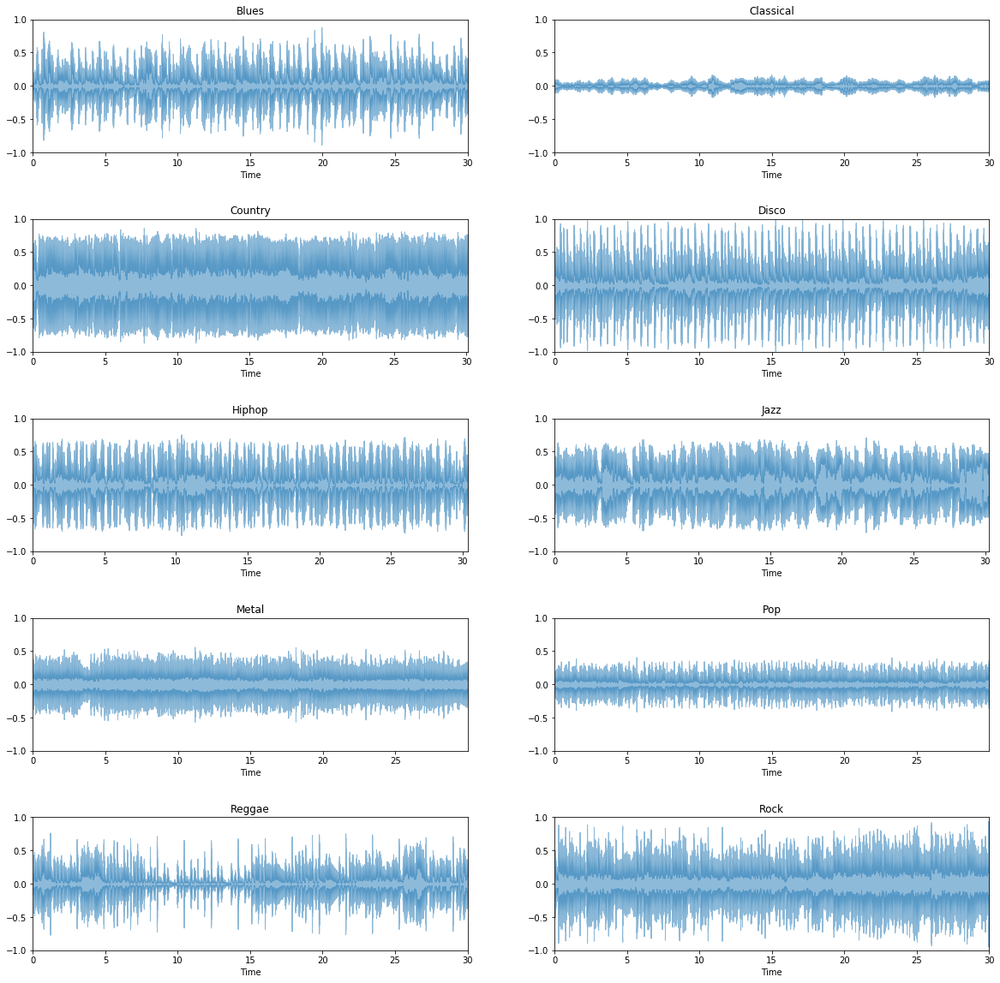

In [16]:
plt.figure(figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)

plt.subplot(5, 2, 1)
librosa.display.waveplot(audio_signal[0],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Blues")

plt.subplot(5, 2, 2)
librosa.display.waveplot(audio_signal[82],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Classical")

plt.subplot(5, 2, 3)
librosa.display.waveplot(audio_signal[170],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Country")

plt.subplot(5, 2, 4)
librosa.display.waveplot(audio_signal[250],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Disco")

plt.subplot(5, 2, 5)
librosa.display.waveplot(audio_signal[350],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Hiphop")

plt.subplot(5, 2, 6)
librosa.display.waveplot(audio_signal[470],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Jazz")

plt.subplot(5, 2, 7)
librosa.display.waveplot(audio_signal[500],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Metal")

plt.subplot(5, 2, 8)
librosa.display.waveplot(audio_signal[580],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Pop")

plt.subplot(5, 2, 9)
librosa.display.waveplot(audio_signal[670],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Reggae")

plt.subplot(5, 2, 10)
librosa.display.waveplot(audio_signal[745],alpha=0.5)
plt.ylim((-1, 1))
plt.title("Rock")

plt.show()

### Calculating mel spectrograms

In [17]:
mel_ = []
test_mel_ = []
sr = 22050
for s in audio_signal:
    mel_.append(librosa.power_to_db(librosa.feature.melspectrogram(s[:600000], sr=sr, n_fft=2048, hop_length=512, n_mels=10)))

for s in test_audio_signal:
    test_mel_.append(librosa.power_to_db(librosa.feature.melspectrogram(s[:600000], sr=sr, n_fft=2048, hop_length=512, n_mels=10)))

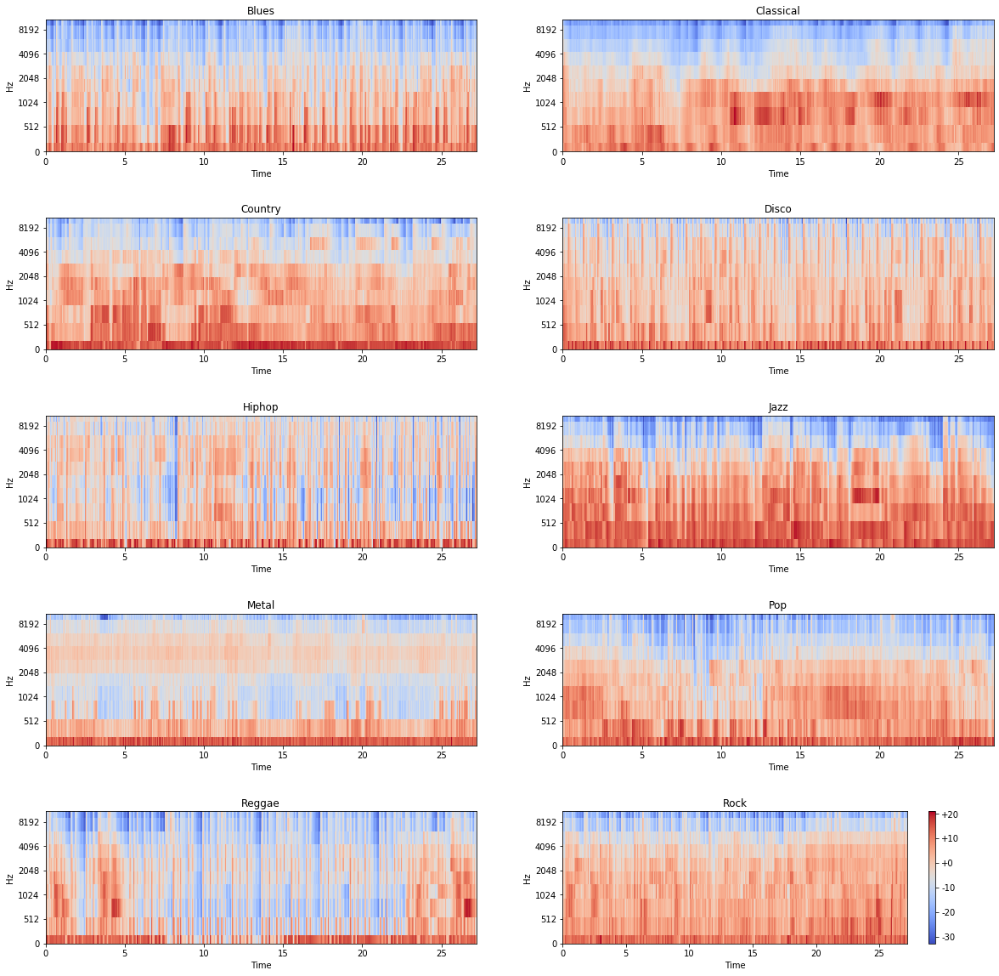

In [18]:
plt.figure(figsize=(20, 20))
plt.subplots_adjust(hspace=0.5)

plt.subplot(5, 2, 1)
librosa.display.specshow(mel_[0], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.title("Blues")

plt.subplot(5, 2, 2)
librosa.display.specshow(mel_[82], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.title("Classical")

plt.subplot(5, 2, 3)
librosa.display.specshow(mel_[170], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Country")

plt.subplot(5, 2, 4)
librosa.display.specshow(mel_[250], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Disco")

plt.subplot(5, 2, 5)
librosa.display.specshow(mel_[350], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Hiphop")

plt.subplot(5, 2, 6)
librosa.display.specshow(mel_[470], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.title("Jazz")

plt.subplot(5, 2, 7)
librosa.display.specshow(mel_[500], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Metal")

plt.subplot(5, 2, 8)
librosa.display.specshow(mel_[580], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Pop")

plt.subplot(5, 2, 9)
librosa.display.specshow(mel_[670], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)

plt.title("Reggae")

plt.subplot(5, 2, 10)
librosa.display.specshow(mel_[745], 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.title("Rock")

plt.colorbar(format="%+2.f")
plt.show()

In [19]:
# X_train = np.array(mel_)[:,:,:,np.newaxis]
# X_test = np.array(test_mel_)[:,:,:,np.newaxis]

X_train = np.array(mel_)
X_test = np.array(test_mel_)

print("X_train : ",X_train.shape)
print("X_test : ",X_test.shape)

X_train :  (809, 10, 1172)
X_test :  (190, 10, 1172)


In [20]:
X_train.reshape(X_train.shape[0],X_train.shape[1]*X_train.shape[2])[:,:,np.newaxis].shape
X_test.reshape(X_test.shape[0],X_test.shape[1]*X_test.shape[2])[:,:,np.newaxis].shape

(190, 11720, 1)

In [27]:
target= []
test_target= []

for i in labels:
    target.append(i-1)

for i in test_labels:
    test_target.append(i-1)

    
y_train = np.array(target)
y_test = np.array(test_target)

In [30]:
def build_model(input_shape):
    
    model = keras.Sequential()

    # 2 LSTM layers
    model.add(keras.layers.LSTM(64, input_shape=input_shape, return_sequences=True))
    model.add(keras.layers.LSTM(64))

    # dense layer
    model.add(keras.layers.Dense(512, activation='relu'))
    #model.add(keras.layers.Dropout(0.3))
    model.add(keras.layers.Dense(128, activation='relu'))
    
    # output layer
    model.add(keras.layers.Dense(10, activation='softmax'))

    return model

In [31]:
input_shape = (X_train.shape[1], X_train.shape[2]) 

model = build_model(input_shape)

optimiser = keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimiser,loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model.summary()

history = model.fit(X_train, y_train,validation_data=(X_test,y_test),steps_per_epoch=8, batch_size=16, epochs=20)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_8 (LSTM)                (None, 10, 64)            316672    
_________________________________________________________________
lstm_9 (LSTM)                (None, 64)                33024     
_________________________________________________________________
dense_14 (Dense)             (None, 512)               33280     
_________________________________________________________________
dense_15 (Dense)             (None, 128)               65664     
_________________________________________________________________
dense_16 (Dense)             (None, 10)                1290      
Total params: 449,930
Trainable params: 449,930
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
8/8 [==============================] - 1s 102ms/step - loss: 2.2944 - accuracy: 0.1562 - val_loss: 2.30